#                                               Fifa20 Project
## PRCP-1004-Fifa20

# Plem statement:
##### Task 1:-Prepare a complete data analysis report on the given data.
##### Task 2:- Explore football skills and cluster football players based on their attributes.
##### Task3:- Explore the data and attempt all the below asked questions in astep by step manner:
#####    ● Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?
#####     ● Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?
 #####    ● Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 

In [1]:
# Importing all the required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from scipy import stats
from sklearn.decomposition import   PCA
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
# Loading the data
data=pd.read_csv("players_20.csv")
sample=data.loc[:1000,:]
sample.head(pd.set_option("display.max_rows",None))


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3
6,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,79+3,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3
8,177003,https://sofifa.com/player/177003/luka-modric/2...,L. Modrić,Luka Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,...,81+3,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,70+3,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3


In [3]:
data.drop(['sofifa_id', 'player_url'], axis=1, inplace=True) # dropping unwanted columns

# Basic checks

In [4]:
data.head() # displays initial 5 rows

,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [5]:
data.tail() # displays final 5 rows

,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,48,56,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,48,56,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,48,56,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,48,54,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,48,51,...,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [6]:
data.describe() ## Statistical information about numerical data

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,2.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


In [7]:
data.describe(include="O") # for categorical features

,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,...,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,17354,18218,6142,162,698,643,2,9,10,2,...,98,98,98,98,98,96,110,110,110,96
top,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,...,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,11,3,113,1667,33,2322,13960,9875,10750,16310,...,682,636,636,636,682,667,621,621,621,667


In [8]:
data.shape ## Finding the shape of dataset

(18278, 102)

In [9]:
data.info() # Quick summary of dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 102 entries, short_name to rb
dtypes: float64(16), int64(44), object(42)
memory usage: 14.2+ MB


In [10]:
col=['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram',
      'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

# Split the column and remove the '+' with the values after them
for i in col:
    data[i]=data[i].str.split('+', expand=True)[0]

# Domain Knowledge

# The attributes used in the project are:
●	Name: Name of the player. 

●	Age: Age of the player.

●	Height: Height of the player in inches (transformed to centimeters in preprocessing).

●	Overall: General performance quality and value of the player representing the key positional skills and international reputation rated between 1-99. Overall attribute is used only in preprocessing and discussion stages because using it in modelling could lead to domination by this feature. The aim of the project is not basically sort and categorize the players using their overall talent and international reputation, but to cluster them based on using their whole skillset.

●	Potential: Maximum Overall rating expected to be reached by a player in the top of his career rated between 1-99.

●	PreferredFoot: Right or Left. Label encoder is applied as 0 for left and 1 for right.

●	WeakFoot: Represents how well a player uses his weak foot (e.g. left for righties) rated between 1 to 5.

●	WorkRate: Degree of the effort the player puts in terms of attack and defense rated as low, medium and high. This feature is divided into two new features as AttackWorkRate and DefenseWorkRate. Besides, label encoder is applied as 0 for low, 0.5 for medium and 1 for high.

●	Position: Position of the players on the pitch which determines their roles and responsibilities in the team. Forward positions in the football and FIFA 19 can be grouped as striker (ST: center striker, RS: right striker, LS: left striker), forward (CF: center forward, RF: right forward, LF: left forward) and winger (RW: right winger, LW: left winger). The word, forward, is used both as a general term and a special position. Strikers are positioned in front of forwards and wingers and very closed to the opposing goal. Their main responsibilities are attacking and scoring goals, that’s why their ball control, shooting and finishing skills are expected to be well. Center forwards are positioned right behind the strikers. They are expected to receive balls from the others and score assists to the others or goals. In addition to the skills expected from strikers, they have to be good at passing. Right forwards and left forwards are positioned at the right and left of the center forwards with the same expectations. Wingers are positioned near the touchlines to create chances for strikers and forwards from the right and left side of the field by breakthrough and crosses and to score goals. They are expected to be good at dribbling, acceleration, passing and crossing. Positions are used only in preprocessing and discussion stages. 

●	ST: Positional skill. Player’s general ability when playing in ST position rated between 1-99.

●	RS: Positional skill. Player’s general ability when playing in in RS position rated between 1-99.

●	LS: Positional skill. Player’s general ability when playing in in LS position rated between 1-99.

●	CF: Positional skill. Player’s general ability when playing in in CF position rated between 1-99.

●	RF: Positional skill. Player’s general ability when playing in in RF position rated between 1-99.

●	LF: Positional skill. Player’s general ability when playing in in LF position rated between 1-99.

●	RW: Positional skill. Player’s general ability when playing in in RW position rated between 1-99.

●	LW: Positional skill. Player’s general ability when playing in in LW position rated between 1-99.

●	Crossing: Crossing skill of the player rated between 1-99. Cross is a long-range pass from wings to center.

●	Finishing: Finishing skill of the player rated between 1-99. Finishing in football refers to finish an attack by scoring a       goal.

●	HeadingAccuracy: Player’s accuracy to pass or shoot by using his head rated between 1-99.

●	ShortPassing: Player’s accuracy for short passes rated between 1-99.

●	LongPassing: Player’s accuracy for long passes rated between 1-99.

●	Dribbling: Dribbling skill of the player rated between 1-99. Dribbling is carrying the ball without losing while moving in       one particular direction.

●	SprintSpeed: Speed rate of the player rated between 1-99.

●	Acceleration: Shows how fast a player can reach his maximum sprint speed rated between 1-99.

●	FKAccuracy: Player’s accuracy to score free kick goals rated between 1-99.

●	BallControl: Player’s ability to control the ball rated between 1-99.

●	Balance: Player’s ability to remain steady while running, carrying and controlling the ball rated between 1-99.

●	ShotPower: Player’s strength level of shooting the ball rated between 1-99.

●	Jumping: Player’s jumping skill rated between 1-99.

●	Penalties: Player’s accuracy to score goals from penalty rated between 1-99.

●	Strength: Physical strength of the player rated between 1-99.

●	Agility: Gracefulness and quickness of the player while controlling the ball rated between 1-99.

●	Reactions: Acting speed of the player to what happens in his environment rated between 1-99.

●	Aggression: Aggression level of the player while pushing, pulling and tackling rated between 1-99.

●	Positioning: Player’s ability to place himself in the right position to receive the ball or score goals rated between 1-99.

●	Vision: Player’s mental awareness about the other players in the team for passing rated between 1-99.

●	Volleys: Player’s ability to perform volleys rated between 1-99.

●	LongShots: Player’s accuracy of shoots from long distances rated between 1-99.

●	Stamina: Player’s ability to sustain his stamina level during the match rated between 1-99. Players with lower stamina get       tired fast.

●	Composure: Player’s ability to control his calmness and frustration during the match rated between 1-99.

●	Curve: Player’s ability to curve the ball while passing or shooting rated between 1-99.

●	Interceptions: Player’s ability to intercept the ball while opposite team’s players are passing rated between 1-99. It is a     defensive skill.

●	StandingTackle: Player’s ability to perform tackle (take the ball from the opposite player) while standing rated between 1-     99. It is a defensive skill.

●	SlidingTackle: Player’s ability to perform tackle by sliding rated between 1-99. It is a defensive skill.

●	Marking: Player’s ability to apply strategies to prevent opposing team from taking the ball rated between 1-99. It is a         defensive skill.  



# Task 1:-Prepare a complete data analysis report on the given data.

## EDA (Exploratory data analysis)

In [11]:
# Univariate Analysis using sweetviz
import sweetviz
my_report = sweetviz.analyze(data)
my_report.show_html()

                                             |                                                          | [  0…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# * insights from Univariate Analysis *
AGE:
The range of player's age is between 16 to 42 and the palyers with 20 and 25 age has maximum counts.


HEIGHT CM:
The maximum height of player is 180 cm, maximum height is 205 and minimum height is 156cm.
players with 180 cm has maximum counts.


WEIGHT KG:
The range of weight of player between 50 to 110kg.
maximum players are of weight 70kg.


OVERALL:
overall performance of the players ranges between 40-100.

POTENTIAL:
The maximum score of player potential is 95.0 and minimum score of potential is 49.0

VALUE EUR:
The average value of player is 2.5million.
Maximum value of player is 105.5 million.

WAGE EUR:
The maximum living wage of player is 565k with the average of 9k.

PREFEERED FOOT:
75% of player prefeered right foot.i,e most of the players usually play using their hight foot as compared to left foot
25% of player prefeered left foot.

INTERNATIONAL REPUTATION:
The range of international reputation is 1 to 5.
92% of player rated with 1, 6% of player is rated with 2 and remaining player rated with 3,4,5 rating.

WEEK FOOT:
A week foot is rated between 1 to 5.
Most of week foot player rating is 3

SKILL MOVES:
The skill moves range between 1 to 5.
2 skill moves is maximum in player as well as 36% is 3 and 11% is 1 skill moves.

WORK RATE:
The maximum  count of work rate is medium/medium.

BODY TYPE:
maximum players has normal body type
36% player body type is lean.

REAL FACE:
89% player face is not real and remaining 11% face is real in game.

RELEASE CLAUSE EUR:
The maximum release clasue of player is 165.8million with the average of 4.7 million

PLAYER TAGS:
Strength, acrobat, engine, and speedster this tags is most in player tags

TEAM POSITION & NATION POSITION:
The maximum 7280 is SUB, 2958 is RES team posistion

TEAM JERSEY NUMBER:
The range of team jersey number is 1 to 99.
Maximum team jersey number between 1 to 40.

CONTRACT VALID UNTIL:
Most of the player contract valid until 2020, 23% player contract valid until 2021
The range of contract year between 2019 to 2026.

NATION JERSEY NUMBER:
The range of nation jersey number between 1 to 30.
Most of the jersey no between 1 to 20.

PACE:
The most of the pace of player between 60 to 80.

SHOOTING:
The range of shooting score between 15 to 93, Most number of shooting score around 25 to 70

PASSING:
The range of passing score of the player is 24 to 92 with the average 57.2.

DRIBBLING:
The most no of dribbling score between 50 to 80.

DEFENDING:
The range of defending between 15 to 90.the Most no of defending score between 50 to 70.

PHYSIC:
The physic score range between 27.0 to 90.0 the most no of physcore between 60 to 80

GK DIVING:
Most no of score of gk diving between 60 to 70

GK HANDLING:
The most observation of gk handling between 60 to 70, maximum score is 92 and minimum score is 42

GK KICKING:
The range of gk kicking in between 35.0 to 93.0 with the average of 61.8.

GK REFLEX:
Most of the gk reflex between 60 to 70.

GK SPPED:
The highest speed of of gk is 65.0, most no of gk speed between 25 to 50

GK POSITIONING:
Most gk positioning score is 65 and maximum score is 91 as well as minimum score is 41

ATTACKING CROSSING:
The attacking crossing range between 5 to 93, the most observation of attacking passing between 50 to 70

ATTACKING FINISHING:
Most of the attacking finishing is 60,Maximum 95 and minimum 2 attacking finishing.

ATTACKING HEADING ACCURACY:
Heading accuracy range between 5 to 93,most observation of attacking heading accuracy between 50 to 60

ATTACKING SHORT PASSING:
most observation of attacking short passing between 60 to 70

ATTACKING VOLLEYS:
most observation of attacking volleys between 30 to 70 with the average of 42.8.

SKILL DRIBBLING:
most observation of skill dribbling is 65.
The range of skill dribbling between 4 to 97

SKILL CURVE:
The most observation of skill curve between 40 to 70, maximum score is 94 and minimum score is 6

SKILL FK ACCURACY:
The maximum accuracy is 94 and minimum accuracy is 4 with the average of 42.7

SKILL LONG PASSING:
The most observation of skill long passing between 50 to 60, maximum score is 92 and minimum score is 8

SKILL BALL CONTROL:
The maximum skill ball control is 96 and minimum skill ball control is 5 with the average of 58.5

MOVEMENT ACCELERATION:
The most observation of movement acceleration between 60 to 80, maximum score is 97 and minimum score is 12

MOVEMENT SPRINT SPPED:
Maximum sprint speed is 96 and minimum sprint speed is 11 with the average of 64.4

MOVEMENT AGILITY:
Maximum movement agility is 96 and minimum movement agility is 11 with the average of 63.5

MOVEMENT REACTION:
Maximum movement reaction is 96 and minimum movement reaction is 21 with the average of 61.8

MOVEMENT BALANCE:
The range of movement balance is 12 to 97 with 64.9 average.

POWER SHOT POWER:
Maximum shot power is 95 and minimum shot power is 14 with the average of 58.2

POWER JUMPING:
Maximum power jumping is 95 and minimum power jumping is 19 with the average of 64.9

POWER STAMINA:
Maximum power stamina is 97 and minimum shot stamina is 12 with the average of 62.9

POWER STRENGTH:
Maximum power strength is 97 and minimum power strength is 20 with the average of 65.2

POWER LONG SHOT:
Maximum power long shot is 94 and minimum power long shot is 4 with the average of 46.8

MENTALITY AGGRESSION:
Maximum mentality aggression is 95 and minimum mentality aggression is 9 with the average of 55.7

MENTALITY INTERCEPTIONS:
Maximum mentality interception is 93 and minimum mentality interception is 3 with the average of 46.3

MENTALITY POSITIONING:
Maximum mentality positioning is 95 and minimum mentality positioning is 2 with the average of 50.1

MENTALITY VISION:
Maximum mentality vision is 94 and minimum mentality vision is 9 with the average of 53.6

MENTALITY PENALTIES:
Maximum mentality penalties is 92 and minimum mentality penalties is 7 with the average of 48.7


MENTALITY COMPOSER:
Maximum mentality composure is 96 and minimum mentality composure is 12 with the average of 58.5

DEFENDING MARKING:
Maximum defending marking is 94 and minimum defending marking is 1 with the average of 46.8

DEFENDING STANDING TACKLE:
Maximum defending standing tackle is 92 and minimum defending standing tackle is 5 with the average of 47.6

DEFENDING SLIDING TACKLE:
Maximum defending sliding tackle is 90 and minimum defending sliding tackle is 3 with the average of 45.6

GOALKEEPING DIVING:
Maximum goalkeeping diving is 90 and minimum goalkeeping diving is 1 with the average of 16.6

GOALKEEPING HANDLING:
Maximum goalkeeping diving is 92 and minimum goalkeeping diving is 1 with the average of 16.4

GOALKEEPING KICKING:
Maximum goalkeeping diving is 93 and minimum goalkeeping diving is 1 with the average of 16.2

GOALKEEPING POSITIONING:
Maximum goalkeeping diving is 91 and minimum goalkeeping diving is 1 with the average of 16.4

GOALKEEPING REFLEX:
Maximum goalkeeping diving is 92 and minimum goalkeeping diving is 1 with the average of 16.7

PLAYER POSITIONS
 in this column the player's position LS, ST, RS, LW, LF, CF, LF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB, the scores of player's position are almost same .

## Task3:- Explore the data and attempt all the below asked questions in a
## step by step manner:

Text(0.5, 1.0, ' top 10 countries with most number of players')

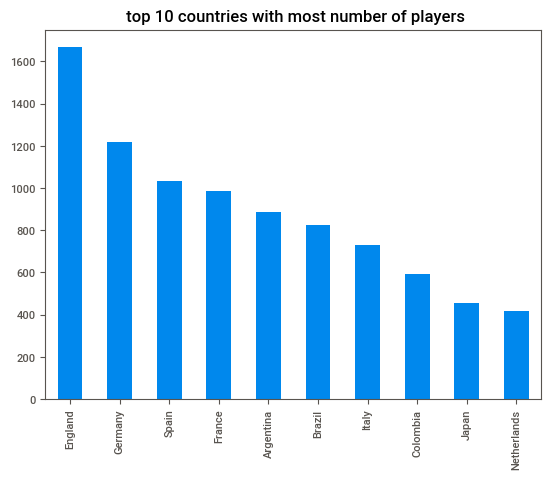

In [12]:
plot=data.nationality.value_counts()[:10]
plot.plot(kind="bar")
plt.title(' top 10 countries with most number of players')

###### Above are the top 10 countries with most number of players,England has more number of players.

<AxesSubplot:xlabel='age', ylabel='overall'>

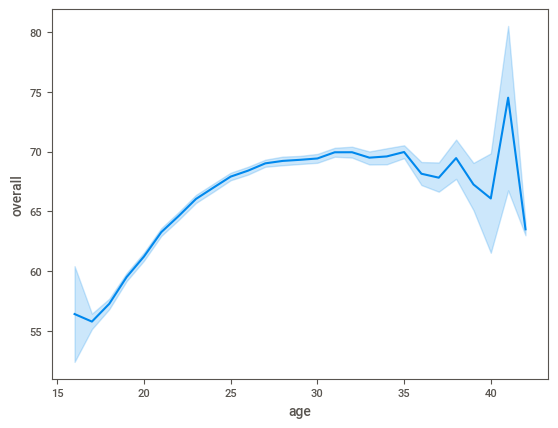

In [13]:
sns.lineplot(x='age',y='overall',data=data)

###### After the age of 35 the performance of the player stops improving

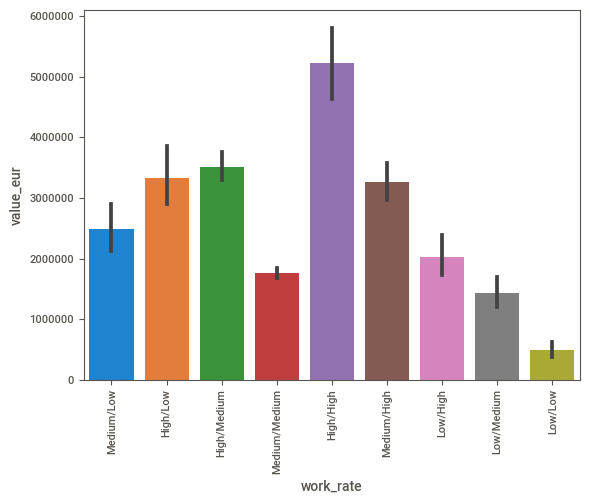

In [14]:
sns.barplot(x='work_rate', y='value_eur', data=data)
plt.xticks(rotation=90)
plt.show()


###### From the above plot we got to know that High Workrate is getting paid more.

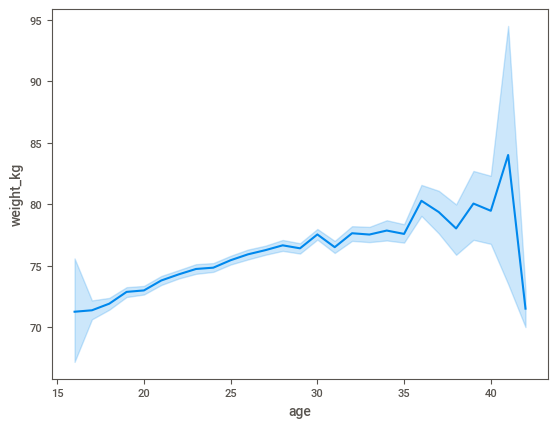

In [15]:
sns.lineplot(x="age",y="weight_kg",data=data)
plt.show()

##### As age increases weight decreases.

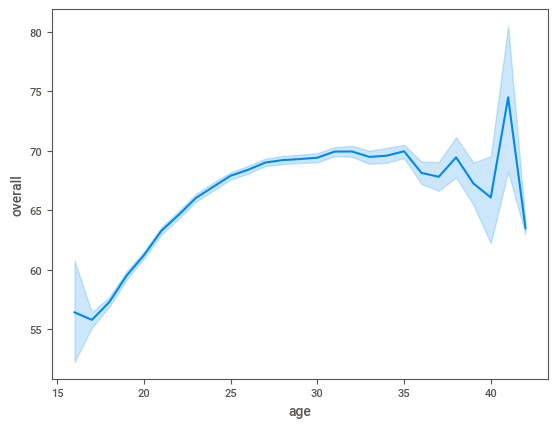

In [16]:
sns.lineplot(x='age', y='overall', data=data)
plt.show()

##### Overall performance of the person decreases after 35 age

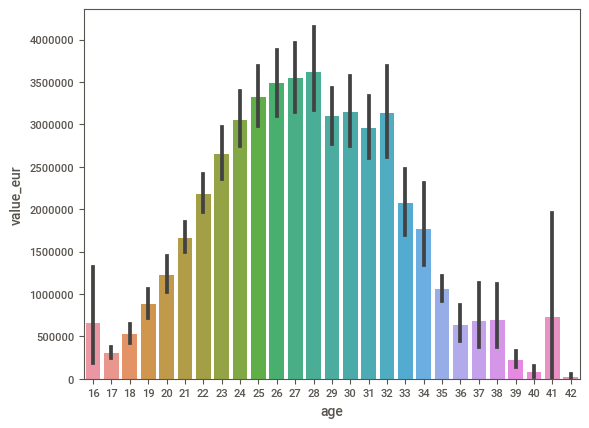

In [17]:
sns.barplot(x="age",y="value_eur",data=data)
plt.show()

##### initially value of the player increases as age increases then decreases w.r.t age

# Data Preprocessing

In [18]:
# checking null values

(data.isnull().sum()/18278)*100


short_name                     0.000000
long_name                      0.000000
age                            0.000000
dob                            0.000000
height_cm                      0.000000
weight_kg                      0.000000
nationality                    0.000000
club                           0.000000
overall                        0.000000
potential                      0.000000
value_eur                      0.000000
wage_eur                       0.000000
player_positions               0.000000
preferred_foot                 0.000000
international_reputation       0.000000
weak_foot                      0.000000
skill_moves                    0.000000
work_rate                      0.000000
body_type                      0.000000
real_face                      0.000000
release_clause_eur             7.101433
player_tags                   91.798884
team_position                  1.313054
team_jersey_number             1.313054
loaned_from                   94.266331


In [19]:
# Getting columns having null values
null_values=pd.DataFrame()
null_values['per']=data.isnull().sum()/len(data)*100
null_values['count']=data.isnull().sum()

In [20]:
list(null_values[null_values['per']>50].index) # list of columns having null values more than 50%

['player_tags',
 'loaned_from',
 'nation_position',
 'nation_jersey_number',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits']

In [21]:
# dropping columns having null values more than 50%
data.drop(list(null_values[null_values['per']>50].index), axis=1, inplace=True)

In [22]:
# filling null values 
data['release_clause_eur']=data['release_clause_eur'].fillna(data['release_clause_eur'].median())
data['team_position']=data['team_position'].fillna(data['team_position'].mode()[0])
data['team_jersey_number']=data['team_jersey_number'].fillna(data['team_jersey_number'].median())
data['joined']=data['joined'].fillna(data['joined'].mode()[0])
data["contract_valid_until"]=data['contract_valid_until'].fillna(data['contract_valid_until'].median())
data['pace']=data['pace'].fillna(data['pace'].median())
data['shooting']=data['shooting'].fillna(data['shooting'].median())
data['passing']=data['passing'].fillna(data['passing'].mean())
data['dribbling']=data['dribbling'].fillna(data['dribbling'].median())
data['defending']=data['defending'].fillna(data['defending'].median())
data['physic']=data['physic'].fillna(data['physic'].median())
data['ls']=data['ls'].fillna(data['ls'].mode()[0])
data['st']=data['st'].fillna(data['st'].mode()[0])
data['rs']=data['rs'].fillna(data['rs'].mode()[0])
data['lw']=data['lw'].fillna(data['lw'].mode()[0])
data['lf']=data['lf'].fillna(data['lf'].mode()[0])
data['cf']=data['cf'].fillna(data['cf'].mode()[0])
data['rf']=data['rf'].fillna(data['rf'].mode()[0])
data['rw']=data['rw'].fillna(data['rw'].mode()[0])
data['lam']=data['lam'].fillna(data['lam'].mode()[0])
data['cam']=data['cam'].fillna(data['cam'].mode()[0])
data['ram']=data['ram'].fillna(data['ram'].mode()[0])
data['lm']=data['lm'].fillna(data['lm'].mode()[0])
data['lcm']=data['lcm'].fillna(data['lcm'].mode()[0])
data['cm']=data['cm'].fillna(data['cm'].mode()[0])
data['rcm']=data['rcm'].fillna(data['rcm'].mode()[0])
data['rm']=data['rm'].fillna(data['rm'].mode()[0])
data['lwb']=data['lwb'].fillna(data['lwb'].mode()[0])
data['ldm']=data['ldm'].fillna(data['ldm'].mode()[0])
data['cdm']=data['cdm'].fillna(data['cdm'].mode()[0])
data['rdm']=data['rdm'].fillna(data['rdm'].mode()[0])
data['rwb']=data['rwb'].fillna(data['rwb'].mode()[0])
data['lb']=data['lb'].fillna(data['lb'].mode()[0])
data['lcb']=data['lcb'].fillna(data['lcb'].mode()[0])
data['cb']=data['cb'].fillna(data['cb'].mode()[0])
data['rcb']=data['rcb'].fillna(data['rcb'].mode()[0])
data['rb']=data['rb'].fillna(data['rb'].mode()[0])

In [23]:
data.isnull().sum() # no null values left

short_name                    0
long_name                     0
age                           0
dob                           0
height_cm                     0
weight_kg                     0
nationality                   0
club                          0
overall                       0
potential                     0
value_eur                     0
wage_eur                      0
player_positions              0
preferred_foot                0
international_reputation      0
weak_foot                     0
skill_moves                   0
work_rate                     0
body_type                     0
real_face                     0
release_clause_eur            0
team_position                 0
team_jersey_number            0
joined                        0
contract_valid_until          0
pace                          0
shooting                      0
passing                       0
dribbling                     0
defending                     0
physic                        0
attackin

# Handling Categorical Columns (Encoding)

In [24]:
(data.dtypes=="object").sum()

38

In [25]:
# extractig years from yy/mm/dd

data["dob"]=pd.to_datetime(data["dob"])
data["dob"]=data["dob"].dt.year
data["dob"].head()

0    1987
1    1985
2    1992
3    1993
4    1991
Name: dob, dtype: int64

In [26]:
data["joined"]=pd.to_datetime(data["joined"])
data["joined"]=data["joined"].dt.year
data["joined"].head()

0    2004
1    2018
2    2017
3    2014
4    2019
Name: joined, dtype: int64

In [27]:
data.dtypes

short_name                     object
long_name                      object
age                             int64
dob                             int64
height_cm                       int64
weight_kg                       int64
nationality                    object
club                           object
overall                         int64
potential                       int64
value_eur                       int64
wage_eur                        int64
player_positions               object
preferred_foot                 object
international_reputation        int64
weak_foot                       int64
skill_moves                     int64
work_rate                      object
body_type                      object
real_face                      object
release_clause_eur            float64
team_position                  object
team_jersey_number            float64
joined                          int64
contract_valid_until          float64
pace                          float64
shooting    

In [28]:
# converting object to int datatype
data["ls"]=pd.to_numeric(data["ls"])
data["st"]=pd.to_numeric(data["st"])
data["rs"]=pd.to_numeric(data["rs"])
data["lw"]=pd.to_numeric(data["lw"])
data["lf"]=pd.to_numeric(data["lf"])
data["cf"]=pd.to_numeric(data["cf"])
data["rf"]=pd.to_numeric(data["rf"])
data["rw"]=pd.to_numeric(data["rw"])
data["lam"]=pd.to_numeric(data["lam"])
data["ram"]=pd.to_numeric(data["ram"])
data["cam"]=pd.to_numeric(data["cam"])
data["lm"]=pd.to_numeric(data["lm"])
data["lcm"]=pd.to_numeric(data["lcm"])
data["cm"]=pd.to_numeric(data["cm"])
data["rcm"]=pd.to_numeric(data["rcm"])
data["rm"]=pd.to_numeric(data["lm"])
data["lwb"]=pd.to_numeric(data["lwb"])
data["ldm"]=pd.to_numeric(data["ldm"])
data["cdm"]=pd.to_numeric(data["cdm"])
data["rdm"]=pd.to_numeric(data["rdm"])
data["rwb"]=pd.to_numeric(data["rwb"])
data["lb"]=pd.to_numeric(data["lb"])
data["lcb"]=pd.to_numeric(data["lcb"])
data["cb"]=pd.to_numeric(data["cb"])
data["rb"]=pd.to_numeric(data["rb"])
data["rcb"]=pd.to_numeric(data["rcb"])

In [29]:
# label Encoding
from sklearn.preprocessing import LabelEncoder
lb=LabelEncoder()

In [30]:
#data.player_url=lb.fit_transform(data.player_url)
data.short_name=lb.fit_transform(data.short_name)
data.long_name=lb.fit_transform(data.long_name)
data.nationality=lb.fit_transform(data.nationality)
data.club=lb.fit_transform(data.club)
data.player_positions=lb.fit_transform(data.player_positions)
data.preferred_foot=lb.fit_transform(data.preferred_foot)
data.work_rate=lb.fit_transform(data.work_rate)
data.body_type=lb.fit_transform(data.body_type)
data.real_face=lb.fit_transform(data.real_face)
data.team_position=lb.fit_transform(data.team_position)

In [31]:
(data.dtypes=="object").sum() # no categorical columns left

0

# Replacing Outliers

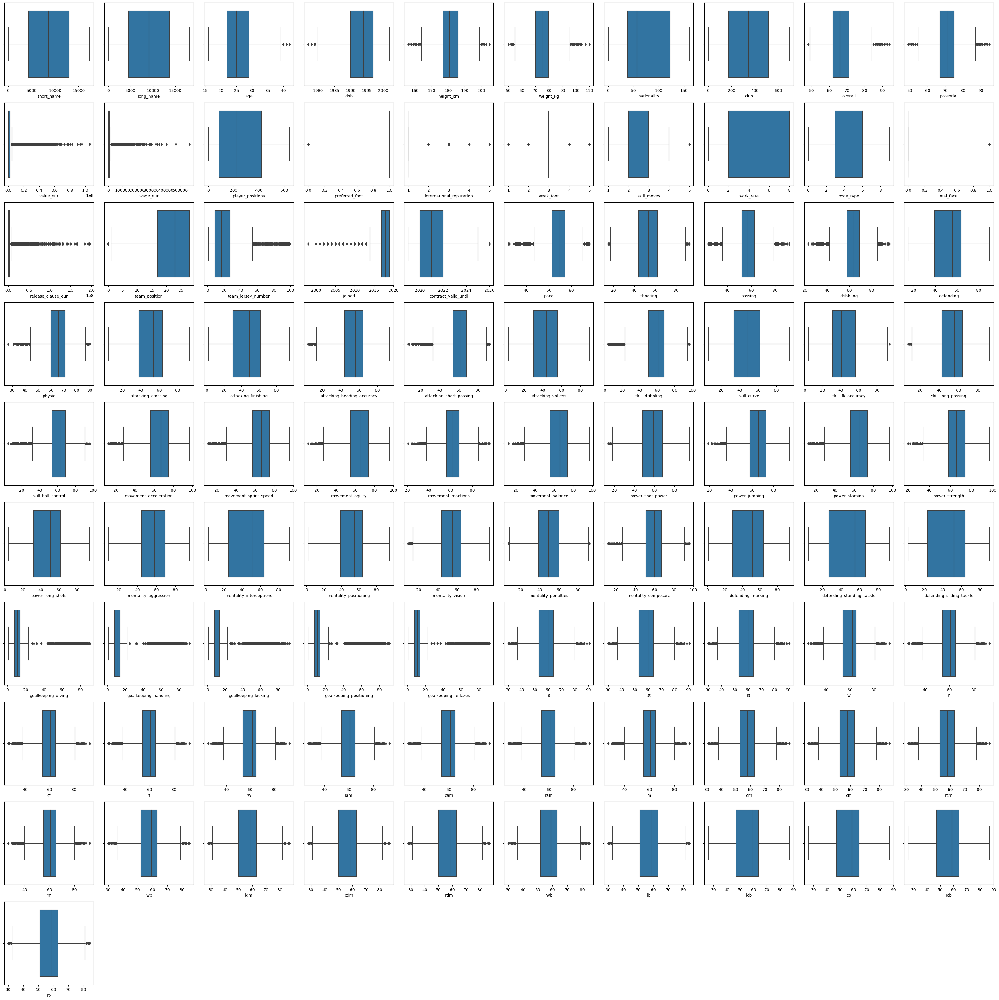

In [32]:
#Using boxplot to detect outliers
plt.figure(figsize=(35,35),facecolor='white')

plotnumber=1

for column in data:
        ax=plt.subplot(10,10,plotnumber)
        sns.boxplot(x = data[column])
        plotnumber+=1
plt.tight_layout() 

In [33]:
columns = list(data.columns)
print(columns)

['short_name', 'long_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 'team_position', 'team_jersey_number', 'joined', 'contract_valid_until', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure

In [34]:
# removing outliers for important columns
outliers=data[['age','height_cm', 'weight_kg','overall','potential','value_eur', 'wage_eur',
              'release_clause_eur','joined','pace','dribbling','physic','shooting','defending']]
              
              

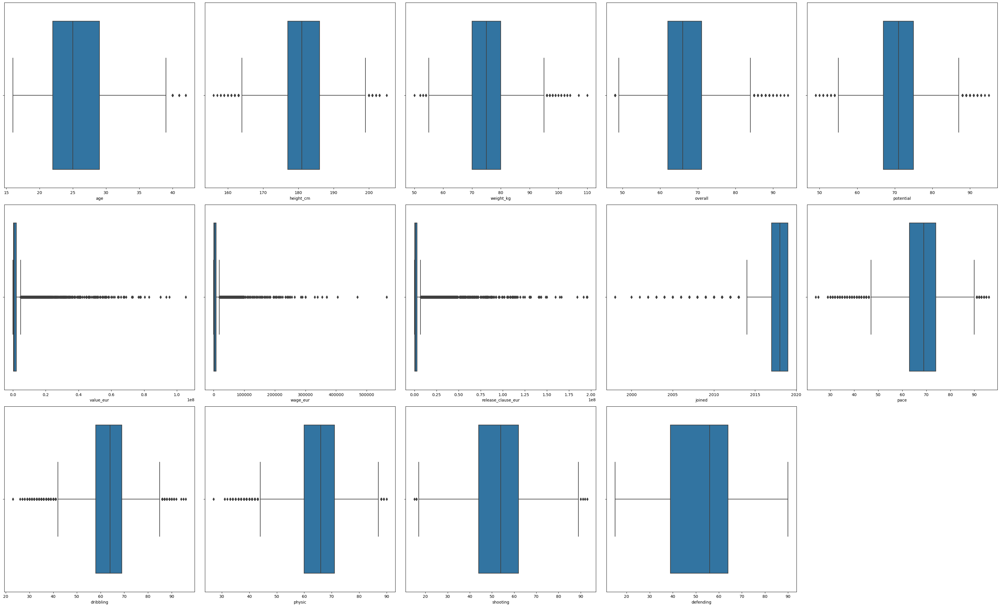

In [35]:
plt.figure(figsize=(35,35),facecolor='white')

plotnumber=1

for column in outliers:
        ax=plt.subplot(5,5,plotnumber)
        sns.boxplot(x = data[column])
        plotnumber+=1
plt.tight_layout() 

In [36]:
IQR=stats.iqr(data["age"],interpolation="midpoint")
Q1=data['age'].quantile(0.25)
Q3=data['age'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['age']>upper_limit,'age']=np.median(data['age'])

In [37]:
IQR=stats.iqr(data['height_cm'],interpolation="midpoint")
Q1=data['height_cm'].quantile(0.25)
Q3=data['height_cm'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['height_cm']>upper_limit,'height_cm']=np.median(data['height_cm'])
data.loc[data['height_cm']<lower_limit,'height_cm']=np.median(data['height_cm'])

In [38]:
IQR=stats.iqr(data['weight_kg'],interpolation="midpoint")
Q1=data['weight_kg'].quantile(0.25)
Q3=data['weight_kg'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['weight_kg']>upper_limit,'weight_kg']=np.median(data['weight_kg'])
data.loc[data['weight_kg']<lower_limit,'weight_kg']=np.median(data['weight_kg'])

In [39]:
IQR=stats.iqr(data['overall'],interpolation="midpoint")
Q1=data['overall'].quantile(0.25)
Q3=data['overall'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['overall']>upper_limit,'overall']=np.mean(data['overall'])

In [40]:
IQR=stats.iqr(data['potential'],interpolation="midpoint")
Q1=data['potential'].quantile(0.25)
Q3=data['potential'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['potential']>upper_limit,'potential']=np.mean(data['potential'])
data.loc[data['potential']<lower_limit,'potential']=np.mean(data['potential'])

In [41]:
IQR=stats.iqr(data['value_eur'],interpolation="midpoint")
Q1=data['value_eur'].quantile(0.25)
Q3=data['value_eur'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['value_eur']>upper_limit,'value_eur']=np.mean(data['value_eur'])

In [42]:
IQR=stats.iqr(data['wage_eur'],interpolation="midpoint")
Q1=data['wage_eur'].quantile(0.25)
Q3=data['wage_eur'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['wage_eur']>upper_limit,'wage_eur']=np.mean(data['wage_eur'])

In [43]:
IQR=stats.iqr(data['release_clause_eur'],interpolation="midpoint")
Q1=data['release_clause_eur'].quantile(0.25)
Q3=data['release_clause_eur'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['release_clause_eur']>upper_limit,'release_clause_eur']=np.mean(data['release_clause_eur'])

In [44]:
IQR=stats.iqr(data['pace'],interpolation="midpoint")
Q1=data['pace'].quantile(0.25)
Q3=data['pace'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['pace']>upper_limit,'pace']=np.median(data['pace'])
data.loc[data['pace']<lower_limit,'pace']=np.median(data['pace'])

In [45]:
IQR=stats.iqr(data['joined'],interpolation="midpoint")
Q1=data['joined'].quantile(0.25)
Q3=data['joined'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['joined']>upper_limit,'joined']=np.median(data['joined'])
data.loc[data['joined']<lower_limit,'joined']=np.median(data['joined'])

In [46]:
IQR=stats.iqr(data['dribbling'],interpolation="midpoint")
Q1=data['dribbling'].quantile(0.25)
Q3=data['dribbling'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['dribbling']>upper_limit,'dribbling']=np.median(data['dribbling'])
data.loc[data['dribbling']<lower_limit,'dribbling']=np.median(data['dribbling'])

In [47]:
IQR=stats.iqr(data['physic'],interpolation="midpoint")
Q1=data['physic'].quantile(0.25)
Q3=data['physic'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['physic']>upper_limit,'physic']=np.median(data['physic'])
data.loc[data['physic']<lower_limit,'physic']=np.median(data['physic'])

In [48]:
IQR=stats.iqr(data['shooting'],interpolation="midpoint")
Q1=data['shooting'].quantile(0.25)
Q3=data['shooting'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['shooting']>upper_limit,'shooting']=np.median(data['shooting'])
data.loc[data['shooting']<lower_limit,'shooting']=np.median(data['shooting'])

In [49]:
IQR=stats.iqr(data['defending'],interpolation="midpoint")
Q1=data['defending'].quantile(0.25)
Q3=data['defending'].quantile(0.75)
lower_limit=Q1-1.5*IQR 
upper_limit=Q3+1.5*IQR 
data.loc[data['defending']>upper_limit,'defending']=np.median(data['defending'])
data.loc[data['defending']<lower_limit,'defending']=np.median(data['defending'])

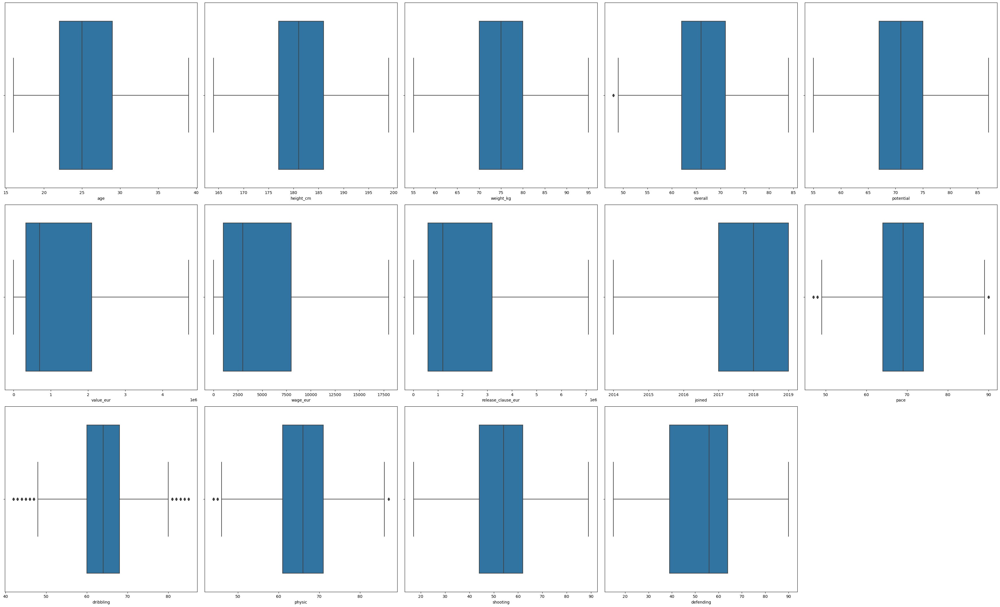

In [50]:
plt.figure(figsize=(35,35),facecolor='white')

plotnumber=1

for column in outliers:
        ax=plt.subplot(5,5,plotnumber)
        sns.boxplot(x = data[column])
        plotnumber+=1
plt.tight_layout() 

# Feature Selection

## checking correlation

In [51]:
data.corr()

,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,team_position,team_jersey_number,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
short_name,1.000000,0.874131,0.008303,-0.007502,0.013890,0.002484,-0.006696,0.030748,-0.007565,-0.021451,-0.003110,-0.001641,-0.005489,0.018781,0.002989,0.000748,-0.014270,0.008732,-0.007917,0.002493,0.000118,-0.007830,-0.019526,-0.015197,0.009148,-0.013037,-0.009162,-0.003708,-0.006138,0.012296,-0.001276,-0.005203,-0.010119,-0.007836,-0.007214,-0.011680,-0.015162,-0.009055,-0.008477,-0.001457,-0.011871,-0.013151,-0.012042,-0.008474,-0.001570,-0.010752,-0.012858,0.001106,0.001679,0.002168,-0.009865,-0.000676,0.009714,-0.007173,-0.005426,-0.017499,-0.005372,0.007573,0.004534,0.002994,0.005375,0.005383,0.004637,0.004067,0.006603,-0.010318,-0.010318,-0.010318,-0.009699,-0.009952,-0.009952,-0.009952,-0.009699,-0.009270,-0.009270,-0.009270,-0.008921,-0.003607,-0.003607,-0.003607,-0.008921,0.005903,0.008013,0.008013,0.008013,0.005903,0.007773,0.009682,0.009682,0.009682,0.007773
long_name,0.874131,1.000000,0.021615,-0.021089,0.000391,-0.016440,-0.025105,0.045904,-0.046789,-0.078151,-0.045332,-0.039258,-0.003668,0.030590,-0.005599,0.000830,-0.031167,0.009134,-0.011439,-0.008113,-0.048232,-0.000754,-0.011223,-0.018464,0.022887,-0.013910,-0.028155,-0.025677,-0.030066,0.005312,-0.007918,-0.018905,-0.021976,-0.021675,-0.024989,-0.029894,-0.031852,-0.031394,-0.026455,-0.018153,-0.031913,-0.018178,-0.015402,-0.009932,-0.024369,-0.006576,-0.043589,0.003328,-0.002648,-0.002576,-0.026192,-0.013971,0.003050,-0.013386,-0.016018,-0.041747,-0.034009,0.000932,-0.002263,-0.004587,0.005783,0.005240,0.006001,0.004665,0.006618,-0.031445,-0.031445,-0.031445,-0.028016,-0.029763,-0.029763,-0.029763,-0.028016,-0.029185,-0.029185,-0.029185,-0.028563,-0.025996,-0.025996,-0.025996,-0.028563,-0.009892,-0.007581,-0.007581,-0.007581,-0.009892,-0.005188,-0.000295,-0.000295,-0.000295,-0.005188
age,0.008303,0.021615,1.000000,-0.988788,0.083876,0.235188,-0.032156,-0.010067,0.467595,-0.266214,0.177076,0.266404,-0.031544,0.006314,0.256229,0.073575,0.048368,-0.093835,0.205806,0.154740,0.155456,-0.164406,-0.224944,-0.104890,-0.121365,-0.066865,0.223729,0.305454,0.142074,0.245395,0.377186,0.131588,0.081417,0.152861,0.138975,0.145703,0.020202,0.144368,0.192785,0.186298,0.091421,-0.148685,-0.139604,-0.019292,0.464164,-0.087434,0.263680,0.186644,0.121439,0.341862,0.164404,0.262186,0.198412,0.089557,0.196567,0.143113,0.370763,0.159595,0.119605,0.104207,0.106934,0.109127,0.108808,0.117147,0.108411,0.283420,0.283420,0.283420,0.204313,0.233873,0.233873,0.233873,0.204313,0.238122,0.238122,0.238122,0.225401,0.341905,0.341905,0.341905,0.225401,0.314383,0.358212,0.358212,0.358212,0.314383,0.302833,0.325219,0.325219,0.325219,0.302833
dob,-0.007502,-0.021089,-0.988788,1.000000,-0.084037,-0.235265,0.029717,0.009492,-0.465011,0.266612,-0.172764,-0.262401,0.029366,-0.007237,-0.260452,-0.075632,-0.045915,0.094469,-0.205716,-0.156251,-0.152228,0.166378,0.227160,0.102064,0.123314,0.064579,-0.224246,-0.303437,-0.140

In [52]:
plt.figure(figsize=(200,200))
sns.heatmap(data.corr(), annot=True, cmap='ocean',annot_kws={"size":20})
plt.show()

In [53]:
correlation=data.corr()
threshold=0.9 # setting threshold

# Identify and eliminate highly correlated columns
columns_to_drop=[]
n_cols=len(correlation.columns)
for i in range(n_cols):
    for j in range(i+1, n_cols):
        if abs(correlation.iloc[i, j])>threshold:
            col_i=correlation.columns[i]
            col_j=correlation.columns[j]
            # Check if any of the columns is not already marked to be dropped
            if col_i not in columns_to_drop:
                columns_to_drop.append(col_j)

In [54]:
len(columns_to_drop)

44

In [55]:
columns_to_drop

['dob',
 'release_clause_eur',
 'ls',
 'st',
 'rs',
 'lam',
 'cam',
 'ram',
 'lm',
 'lcm',
 'cm',
 'rcm',
 'rm',
 'lb',
 'lcb',
 'cb',
 'rcb',
 'rb',
 'skill_ball_control',
 'skill_ball_control',
 'mentality_positioning',
 'movement_sprint_speed',
 'defending_marking',
 'defending_standing_tackle',
 'defending_sliding_tackle',
 'goalkeeping_handling',
 'goalkeeping_kicking',
 'goalkeeping_positioning',
 'goalkeeping_reflexes',
 'lf',
 'cf',
 'rf',
 'rw',
 'lam',
 'cam',
 'ram',
 'lm',
 'rm',
 'ldm',
 'cdm',
 'rdm',
 'rwb',
 'lb',
 'rb']

In [56]:
data.drop(columns_to_drop,axis=1,inplace=True) # dropping highly correlated columns

In [57]:
# model creation
x=data.copy()
x.head()

,short_name,long_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,team_position,team_jersey_number,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,movement_acceleration,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_vision,mentality_penalties,mentality_composure,goalkeeping_diving,lw,lwb
0,9723,9790,32,170,72,5,224,66.244994,71.546887,2.484038e+06,9456.942773,544,0,5,4,4,7,4,1,25,10.0,2018,2021.0,87.0,54.0,92.000000,64.0,39.0,66.0,88,95,70,92,88,97,93,94,92,91,93,95,95,86,68,75,68,94,48,40,94,75,96,6,93,68
1,3164,3180,34,187,83,121,350,66.244994,71.546887,2.484038e+06,9456.942773,620,1,5,4,5,1,1,1,14,7.0,2018,2022.0,90.0,54.0,82.000000,64.0,35.0,78.0,84,94,89,83,87,89,81,76,77,89,87,96,71,95,95,85,78,93,63,29,82,85,95,7,89,65
2,12658,12430,27,175,68,18,462,66.244994,71.546887,2.484038e+06,9456.942773,344,1,5,5,5,2,5,1,0,10.0,2017,2022.0,69.0,85.0,87.000000,64.0,32.0,58.0,87,87,62,87,87,96,88,87,81,94,96,92,84,80,61,81,49,84,51,36,90,90,94,9,90,66
3,7851,7316,26,188,87,133,63,66.244994,71.546887,2.484038e+06,9456.942773,226,1,3,3,1,8,6,1,5,13.0,2014,2023.0,69.0,54.0,57.233777,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,43,67,88,49,59,78,41,78,12,34,19,65,11,68,87,63,59
4,4459,4367,28,175,74,12,505,66.244994,71.546887,2.484038e+06,9456.942773,350,1,4,4,4,2,6,1,14,7.0,2019,2024.0,69.0,83.0,86.000000,64.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,95,90,94,82,56,84,63,80,54,41,89,88,91,11,89,66


In [58]:
# scaling the data
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
x_scaled=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x_scaled.head()

,short_name,long_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,team_position,team_jersey_number,joined,contract_valid_until,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,movement_acceleration,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_vision,mentality_penalties,mentality_composure,goalkeeping_diving,lw,lwb
0,0.560307,0.537410,0.695652,0.171429,0.425,0.031056,0.321377,0.506805,0.51709,0.528519,0.525386,0.847352,0.0,1.00,0.75,0.75,0.875,0.444444,1.0,0.892857,0.091837,0.8,0.285714,0.930233,0.513889,1.000000,0.511628,0.320000,0.511628,0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,0.929412,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,1.000000,0.800000,1.000000,0.056180,1.000000,0.690909
1,0.182332,0.174562,0.782609,0.657143,0.700,0.751553,0.502152,0.506805,0.51709,0.528519,0.525386,0.965732,1.0,1.00,0.75,1.00,0.125,0.111111,1.0,0.500000,0.061224,0.8,0.428571,1.000000,0.513889,0.852941,0.511628,0.266667,0.790698,0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.905882,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,0.858824,0.917647,0.988095,0.067416,0.941176,0.636364
2,0.729442,0.682330,0.478261,0.314286,0.325,0.111801,0.662841,0.506805,0.51709,0.528519,0.525386,0.535826,1.0,1.00,1.00,1.00,0.250,0.555556,1.0,0.000000,0.091837,0.6,0.428571,0.511628,0.944444,0.926471,0.511628,0.226667,0.325581,0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.964706,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.952941,0.976471,0.976190,0.089888,0.955882,0.654545
3,0.452429,0.401603,0.434783,0.685714,0.800,0.826087,0.090387,0.506805,0.51709,0.528519,0.525386,0.352025,1.0,0.50,0.50,0.00,1.000,0.666667,1.0,0.178571,0.122449,0.0,0.571429,0.511628,0.513889,0.488732,0.511628,0.546667,0.511628,0.090909,0.096774,0.113636,0.423529,0.114943,0.086022,0.079545,0.111111,0.380952,0.364706,0.658824,0.893333,0.435294,0.555556,0.776316,0.341176,0.753247,0.088889,0.290698,0.179775,0.658824,0.047059,0.666667,0.966292,0.558824,0.527273
4,0.256958,0.239721,0.521739,0.314286,0.475,0.074534,0.724534,0.506805,0.51709,0.528519,0.525386,0.545171,1.0,0.75,0.75,0.75,0.250,0.666667,1.0,0.500000,0.061224,1.0,0.714286,0.511628,0.916667,0.911765,0.511628,0.266667,0.511628,0.863636,0.881720,0.636364,0.964706,0.919540,0.978495,0.875000,0.833333,0.892857,0.964706,0.988235,0.920000,0.964706,0.839506,0.486842,0.847059,0.558442,0.844444,0.523256,0.426966,0.941176,0.952941,0.940476,0.112360,0.941176,0.654545


# PCA

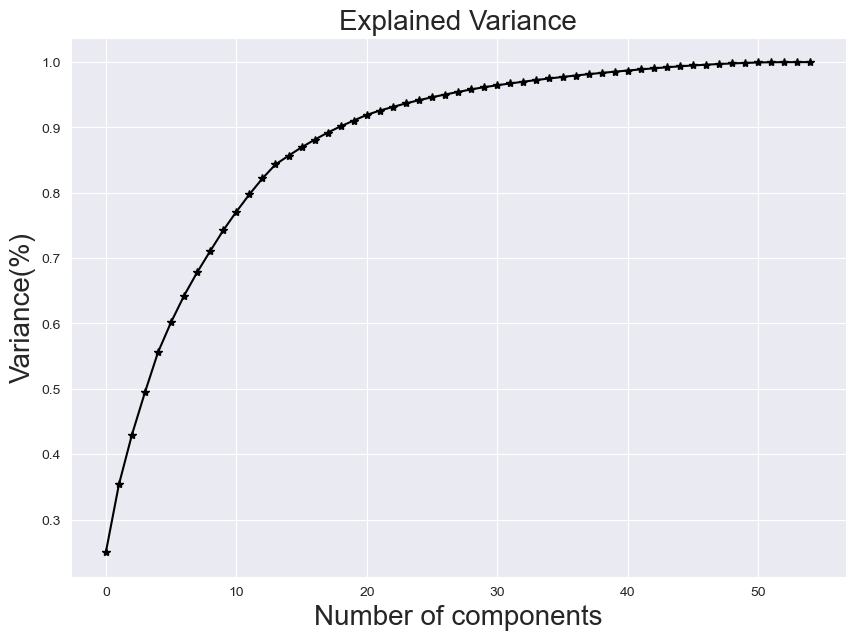

In [59]:
#  Getting optimal value of pca
from sklearn.decomposition import PCA
pca = PCA() # Object creation
principlecomponents = pca.fit_transform(x_scaled) # Fitting the data
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),marker='*',color='k') #plot the variance ratio
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each componant
plt.title('Explained Variance',fontsize=20)
plt.show()

In [60]:
pca = PCA(n_components=30)
new_data = pca.fit_transform(x_scaled)

In [61]:
principal_Df = pd.DataFrame(data = new_data
             , columns = ["PCA 1","PCA 2","PCA 2","PCA 4","PCA 5","PCA 6","PCA 7","PCA 8","PCA 9","PCA 10","PCA 11","PCA 12",
                          "PCA 13","PCA 14","PCA 15","PCA 16","PCA 17","PCA 18","PCA 19","PCA 20","PCA 21","PCA 22","PCA 23",
                          "PCA 24","PCA 25","PCA 26","PCA 27","PCA 28","PCA 29","PCA 30"])
principal_Df.head()

,PCA 1,PCA 2,PCA 2,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,PCA 13,PCA 14,PCA 15,PCA 16,PCA 17,PCA 18,PCA 19,PCA 20,PCA 21,PCA 22,PCA 23,PCA 24,PCA 25,PCA 26,PCA 27,PCA 28,PCA 29,PCA 30
0,2.068210,-0.197900,0.252903,0.645306,0.421417,-0.245532,0.590970,-0.145102,-0.030400,0.486052,0.037082,0.477559,0.306685,-0.473613,-0.133123,-0.041324,0.016884,-0.111361,0.075188,0.159933,0.039316,-0.096868,0.097657,0.172936,-0.379323,0.024168,0.152388,0.224912,0.007009,-0.006587
1,2.029709,-0.022608,-0.742727,0.456682,-0.298364,0.375929,0.045660,0.369495,-0.108643,-0.104985,-0.060323,0.636260,-0.056430,-0.246426,-0.467982,-0.088746,0.063514,-0.446457,0.342110,0.071823,0.146903,-0.120020,-0.168582,0.213123,-0.214185,-0.014085,0.105852,0.282522,0.119239,-0.052601
2,2.040541,-0.136671,-0.559786,0.236881,0.493381,-0.418509,-0.246395,-0.175618,0.314979,-0.048863,-0.070461,1.012345,0.152359,0.152546,0.028864,0.042719,0.120969,-0.090133,-0.017256,0.320978,-0.037881,-0.023608,-0.088286,0.076840,-0.223828,0.000820,0.080434,0.046573,-0.040476,-0.061327
3,-0.973933,0.707338,-0.870998,1.134253,0.323782,-0.319798,-0.244139,0.216944,-0.472637,0.077647,0.447406,0.559829,-0.360058,-0.055013,0.201269,0.143999,0.154420,-0.214855,0.156169,0.008237,-0.087505,0.033142,-0.118533,-0.004740,-0.393048,-0.023446,0.075677,-0.032743,0.010834,-0.300704
4,1.900437,-0.106486,-0.543533,0.384965,-0.168708,-0.164904,-0.071897,-0.063881,0.346217,0.197863,-0.368548,0.668728,0.366866,-0.046543,0.119582,0.205249,0.317706,-0.169027,-0.071387,0.098683,0.064914,0.064735,-0.003696,-0.006158,-0.355252,0.013922,0.112999,-0.047024,-0.101088,-0.061925


# KMeans clustering

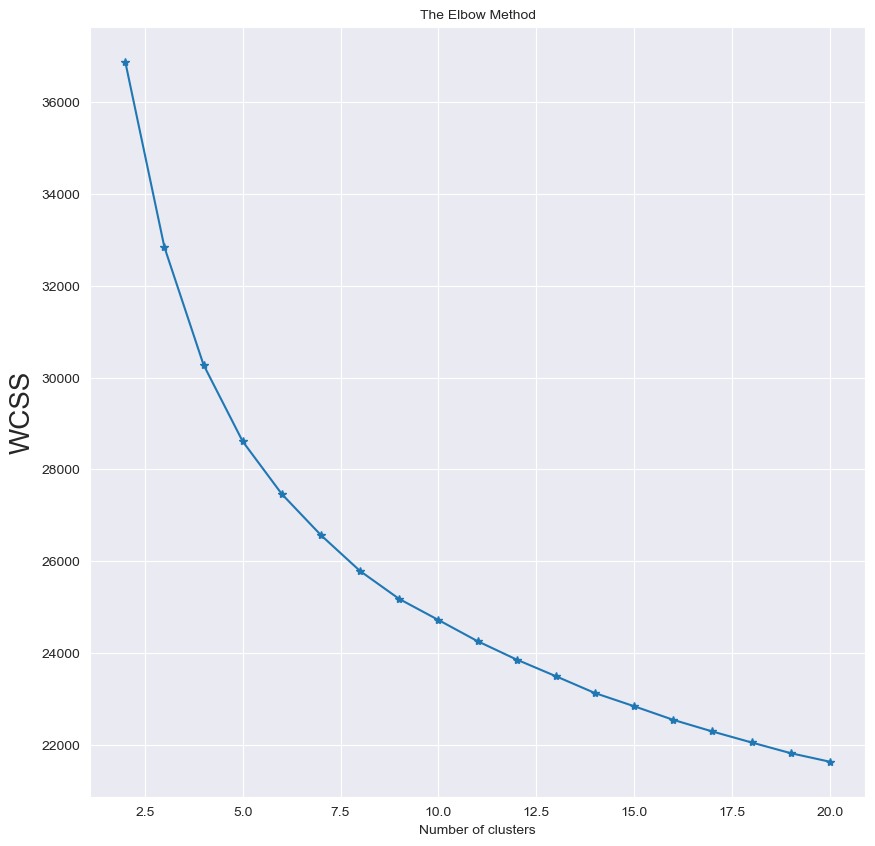

In [62]:
# Initalize the k value
from sklearn.cluster import KMeans
kmeans = KMeans() # Object creation
wcss = [] # Create empty list

for i in range(2,21):
    kmeans = KMeans(n_clusters=i,random_state=42)
    kmeans = kmeans.fit(principal_Df)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10,10))
plt.plot(range(2,21),wcss,marker='*')
plt.title('The Elbow Method',fontsize=10)
plt.xlabel('Number of clusters',fontsize=10)
plt.ylabel('WCSS',fontsize=20)
plt.show()

In [63]:
#  initalize the cluster
kmeans = KMeans(n_clusters=3,random_state=10)

#  Fitting the data
kmeans.fit(principal_Df)

#  Getting labels
kmeans.labels_

#  Print dataset with labels
principal_Df['cluster'] = pd.DataFrame(kmeans.labels_)
principal_Df.head()

,PCA 1,PCA 2,PCA 2,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,PCA 13,PCA 14,PCA 15,PCA 16,PCA 17,PCA 18,PCA 19,PCA 20,PCA 21,PCA 22,PCA 23,PCA 24,PCA 25,PCA 26,PCA 27,PCA 28,PCA 29,PCA 30,cluster
0,2.068210,-0.197900,0.252903,0.645306,0.421417,-0.245532,0.590970,-0.145102,-0.030400,0.486052,0.037082,0.477559,0.306685,-0.473613,-0.133123,-0.041324,0.016884,-0.111361,0.075188,0.159933,0.039316,-0.096868,0.097657,0.172936,-0.379323,0.024168,0.152388,0.224912,0.007009,-0.006587,2
1,2.029709,-0.022608,-0.742727,0.456682,-0.298364,0.375929,0.045660,0.369495,-0.108643,-0.104985,-0.060323,0.636260,-0.056430,-0.246426,-0.467982,-0.088746,0.063514,-0.446457,0.342110,0.071823,0.146903,-0.120020,-0.168582,0.213123,-0.214185,-0.014085,0.105852,0.282522,0.119239,-0.052601,2
2,2.040541,-0.136671,-0.559786,0.236881,0.493381,-0.418509,-0.246395,-0.175618,0.314979,-0.048863,-0.070461,1.012345,0.152359,0.152546,0.028864,0.042719,0.120969,-0.090133,-0.017256,0.320978,-0.037881,-0.023608,-0.088286,0.076840,-0.223828,0.000820,0.080434,0.046573,-0.040476,-0.061327,2
3,-0.973933,0.707338,-0.870998,1.134253,0.323782,-0.319798,-0.244139,0.216944,-0.472637,0.077647,0.447406,0.559829,-0.360058,-0.055013,0.201269,0.143999,0.154420,-0.214855,0.156169,0.008237,-0.087505,0.033142,-0.118533,-0.004740,-0.393048,-0.023446,0.075677,-0.032743,0.010834,-0.300704,1
4,1.900437,-0.106486,-0.543533,0.384965,-0.168708,-0.164904,-0.071897,-0.063881,0.346217,0.197863,-0.368548,0.668728,0.366866,-0.046543,0.119582,0.205249,0.317706,-0.169027,-0.071387,0.098683,0.064914,0.064735,-0.003696,-0.006158,-0.355252,0.013922,0.112999,-0.047024,-0.101088,-0.061925,2


# Model Evaluation

In [64]:
#  Create a new veriable assign to labels
labels = kmeans.labels_
labels

# import library to evaluate the model
from sklearn.metrics import silhouette_score
silhoutte_score_ = silhouette_score(principal_Df,labels)
print("Silhouette Score:",silhoutte_score_)

Silhouette Score: 0.32096748226287264


# Conclusion:

### we have got the maximum silhouette score of 0.32.
### 3 Cluster silhouette score is 0.32.

## Task 1 and Task 3 have already shown in EDA (Data Analysis part)
## Task 2  has done using Clustering And PCA

# Problems faced: